In [60]:
import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np

In [61]:
IMAGES = "/content/"

## **Question 1**

In [62]:
image = cv2.imread(os.path.join(IMAGES, "fg.jpg"))
background_image = cv2.imread(os.path.join(IMAGES, "bg.jpg"))

In [63]:
lower_blue = np.array([0, 100, 0])  
upper_blue = np.array([120, 255, 100])

Part (a)

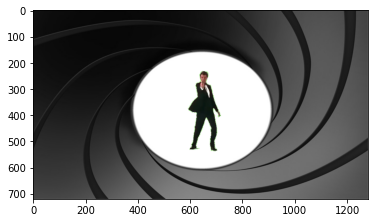

In [64]:
copy_image = np.copy(image)
copy_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask = cv2.inRange(copy_image, lower_blue, upper_blue)
masking = np.copy(copy_image)
masking[mask != 0] = [0, 0, 0]
cropped_image = np.copy(background_image)
cropped_image[mask == 0] = [0, 0, 0]
plt.imshow(cropped_image)
final_image = cropped_image + masking
plt.imshow(final_image)

Part (b)

In [65]:
mansion = cv2.cvtColor(cv2.imread(os.path.join(IMAGES, "skyfall_mansion.jpg")), cv2.COLOR_BGR2RGB)
copy_image_1 = image[30:586, 150:1114]
copy_image_1 = cv2.cvtColor(copy_image_1, cv2.COLOR_BGR2RGB)

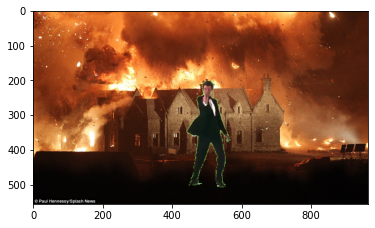

In [66]:
mask = cv2.inRange(copy_image_1, lower_blue, upper_blue)
masking = np.copy(copy_image_1)
masking[mask != 0] = [0, 0, 0]
cropped_image = mansion
cropped_image[mask == 0] = [0, 0, 0]
final_image = cropped_image + masking
plt.imshow(final_image)

Part (c)

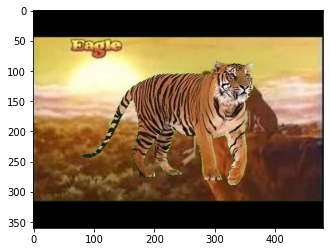

In [67]:
my_image = cv2.imread(os.path.join(IMAGES, "tiger.jpg"))
my_image_copy = np.copy(my_image)
my_image_copy = cv2.cvtColor(my_image_copy, cv2.COLOR_BGR2RGB)
mask = cv2.inRange(my_image_copy, lower_blue, upper_blue)

image = np.copy(my_image_copy)
image[mask != 0] = [0, 0, 0]

my_background = cv2.cvtColor(cv2.imread(os.path.join(IMAGES, "my_background.jpg")), cv2.COLOR_BGR2RGB)

background = my_background[0:360, 0:480]
background[mask == 0] = [0, 0, 0]

final_image = background + image
plt.imshow(final_image)

Green screen helps in this task by taking the object of interest, with **sharp edges**, so that the superposition looks perfect.

## **Question 2**

In [68]:
total_pixels = 1280 * 720
bits_of_data = total_pixels * 24
file_size_in_megabytes = bits_of_data / 8 / 1024 / 1024
cloud_storage_in_megabytes = 4000
number_of_images = cloud_storage_in_megabytes/file_size_in_megabytes
print(round(number_of_images))

1517


## **Question 3**

CCD sensor size = 10 x 10 mm with 1024 x 1024 pixels

50 pixels = 50 / 1024 cm = 0.048828125 cm

Given focal length = 62.5 mm

We know, y = f * Y / d.

Therefore,

50 / 1024 <= 6.25 * 32.8 / d_cm

d_cm <= 6.25 * 32.8 * 1024 / 50 = 41984 cm

d <= 4198.4 cm

In [69]:
image_length = 50 / 1024
focal_length = 6.25
insignia_size = 32.8
distance = focal_length * insignia_size / image_length
print(distance)

4198.4


## **Question 4**

### 4.1

In [70]:
def bitQuantizeImage(image, k):
  result = (pow(2, k) - 1) * ((image - np.min(image))/(np.max(image) - np.min(image)))
  result = np.array(result, dtype=np.uint8)
  return result

### 4.2

k  1


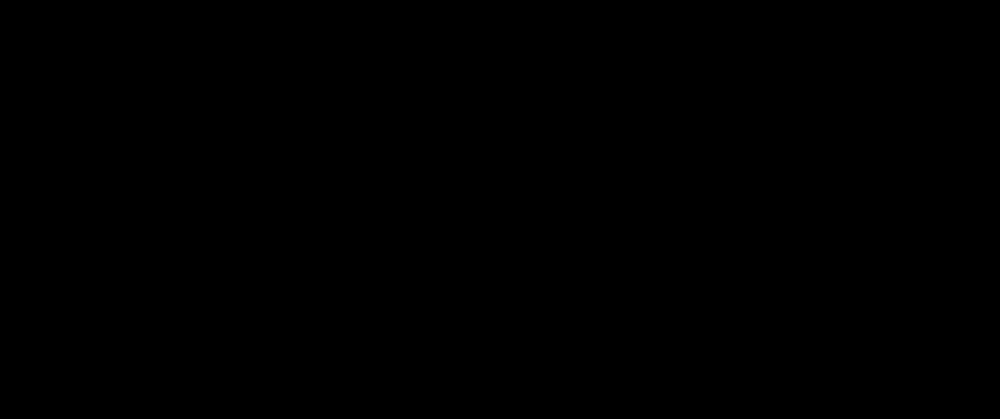

k  2


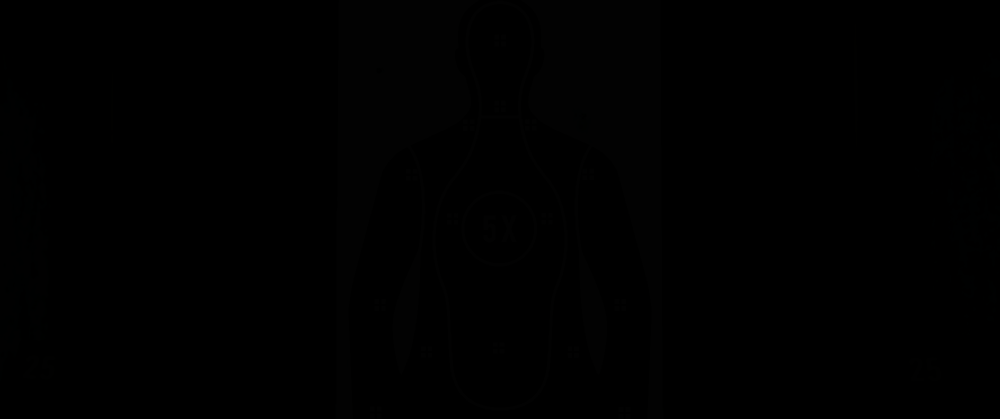

k  3


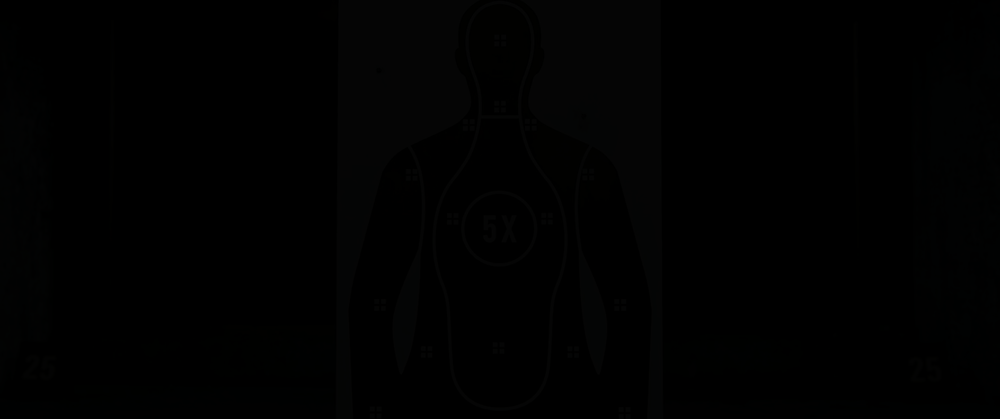

k  4


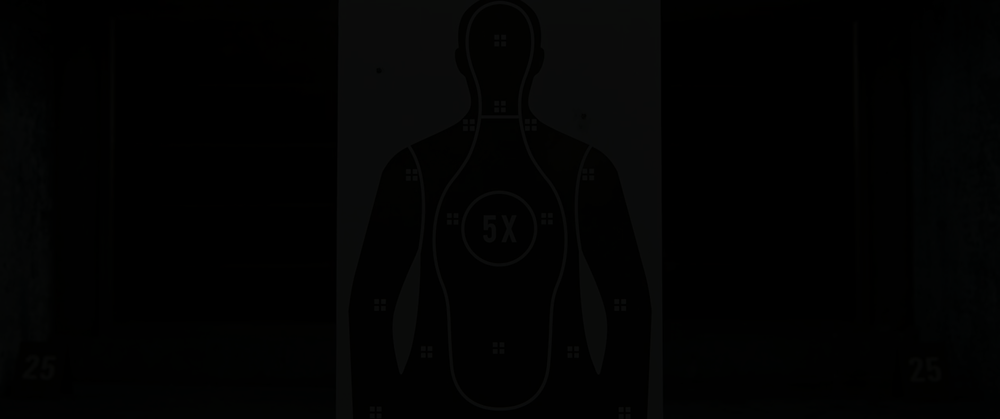

k  5


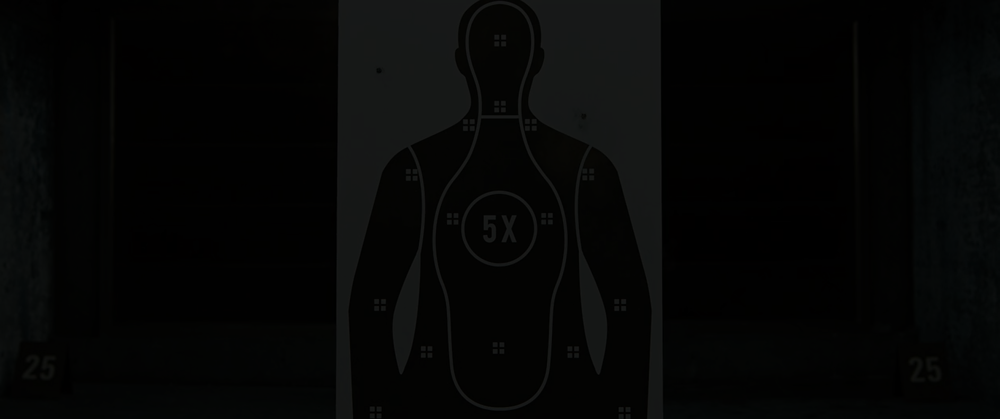

k  6


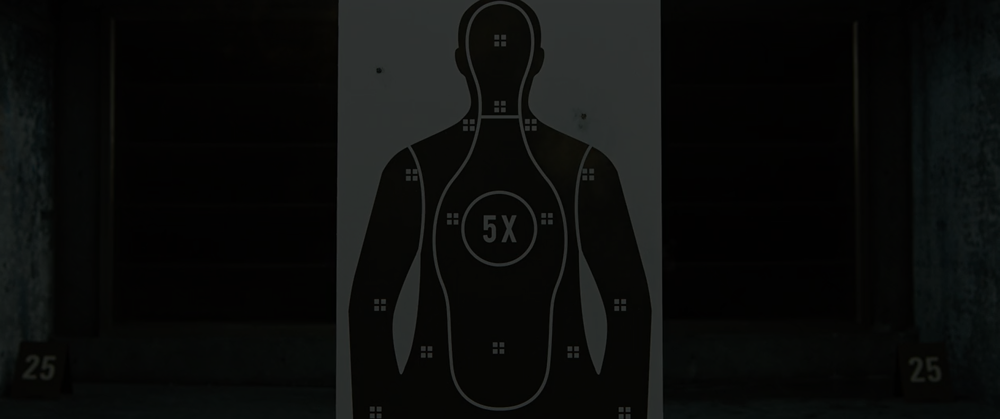

k  7


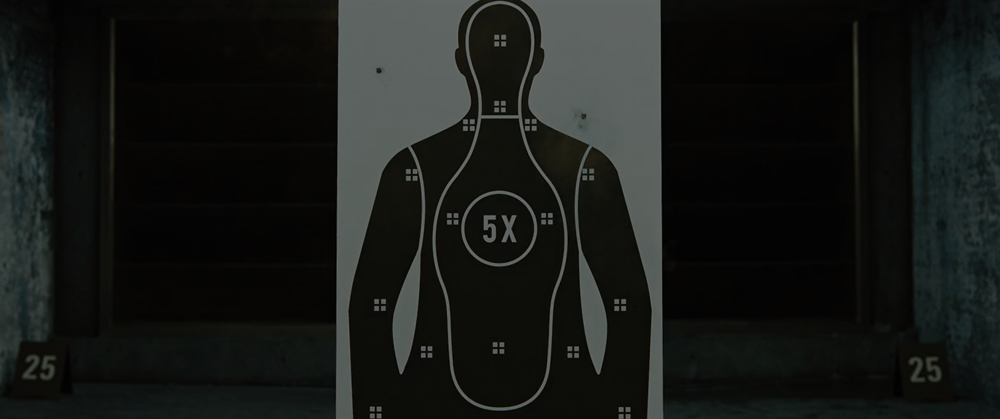

k  8


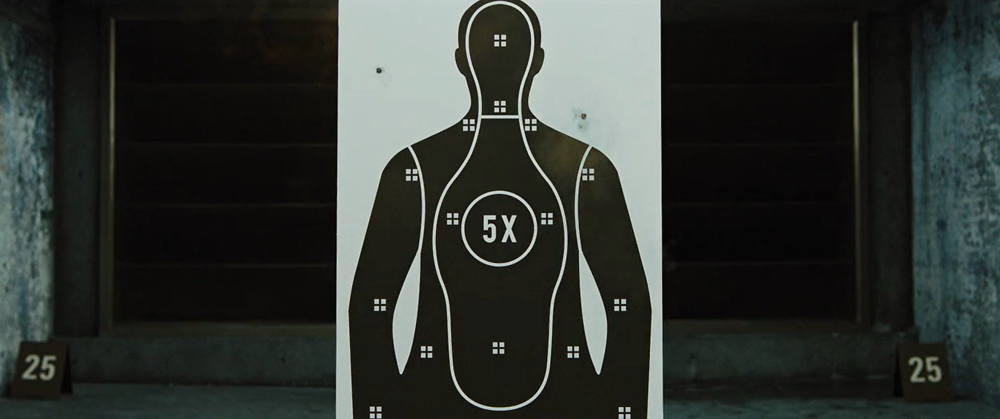

In [71]:
image = cv2.imread(os.path.join(IMAGES, "007_test1.png"))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
for k in range(1, 9):
  copy = np.copy(image)
  print("k ", k)
  cv2_imshow(bitQuantizeImage(copy, k))

### 4.3

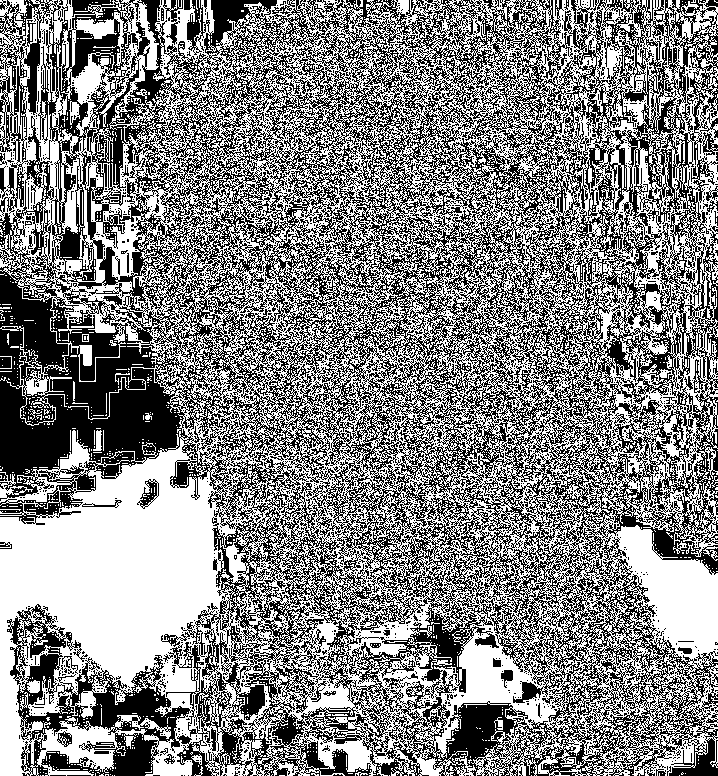

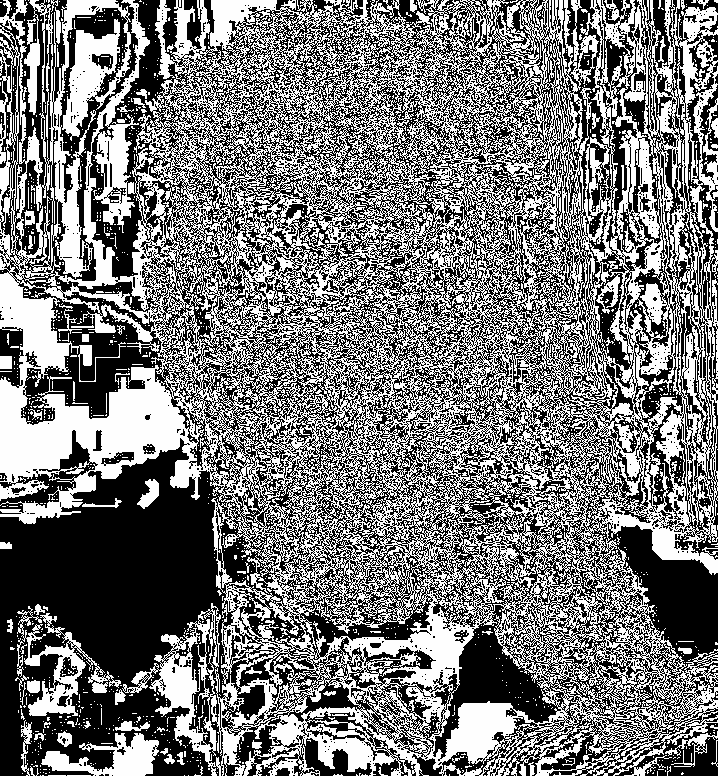

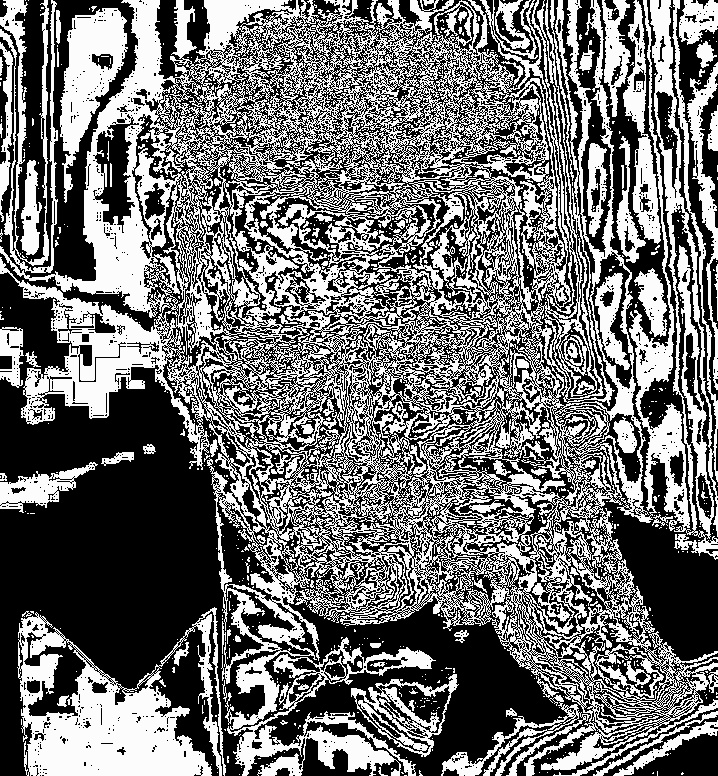

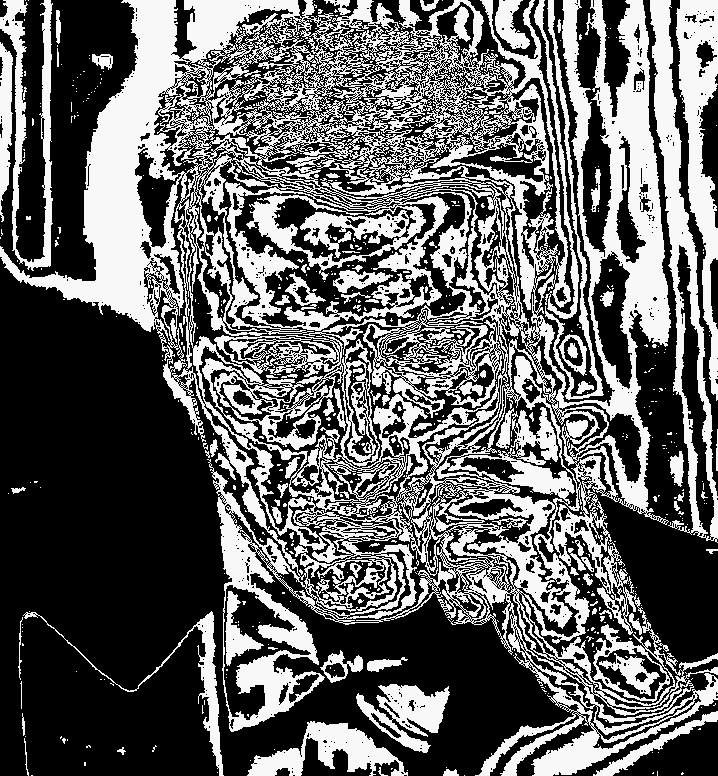

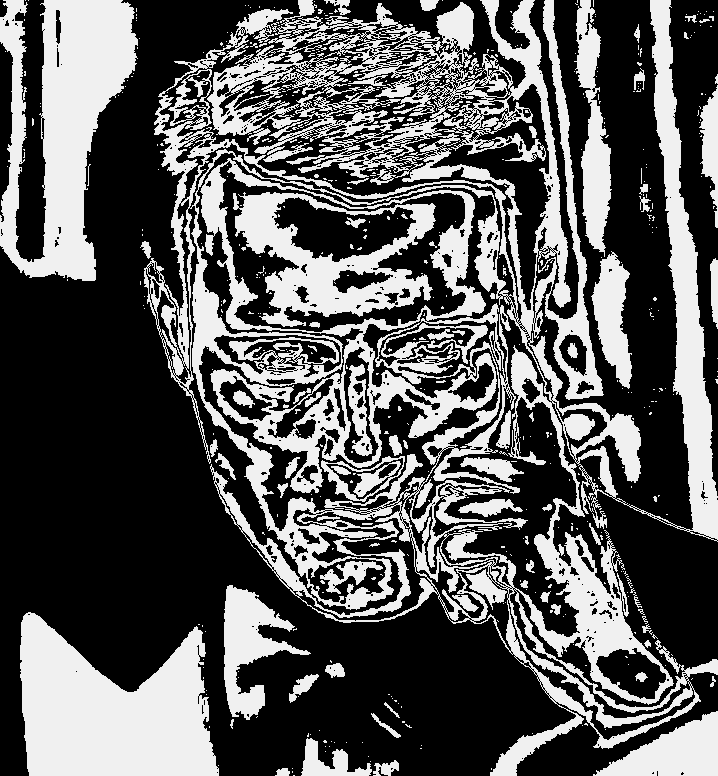

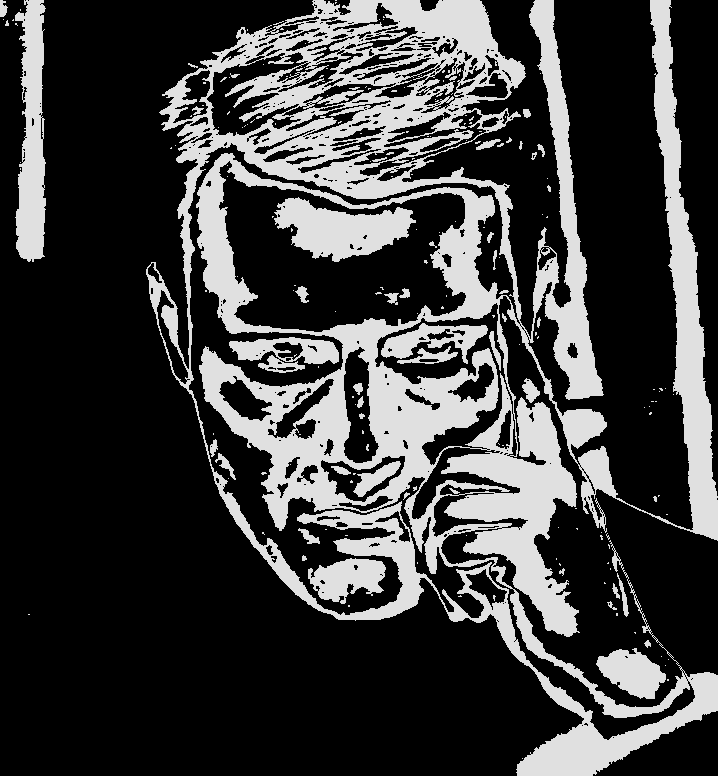

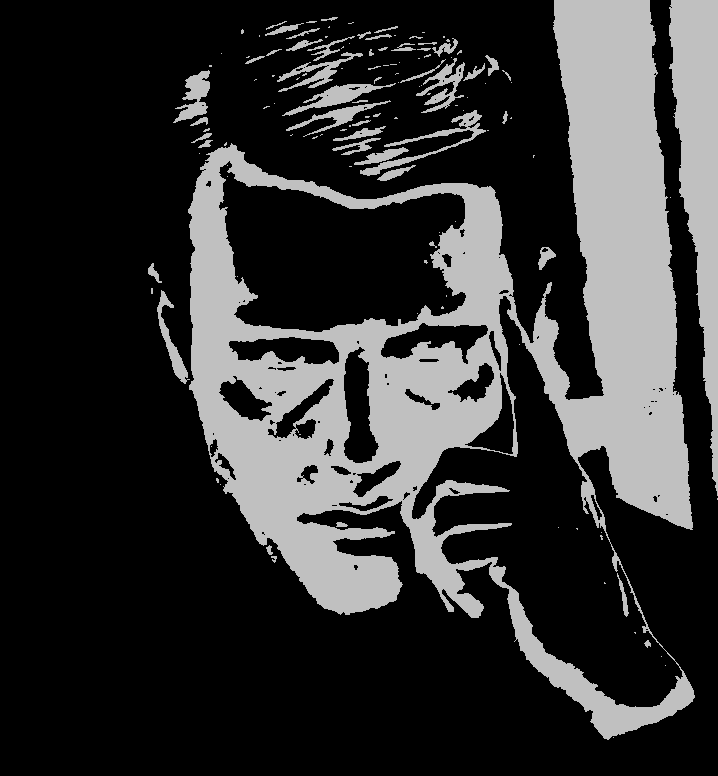

In [72]:
image = cv2.imread(os.path.join(IMAGES, "007_test2.png"))
for i in range(0, 7):
    copy = np.copy(image)
    copy = cv2.cvtColor(copy, cv2.COLOR_BGR2GRAY)
    plane = np.full((copy.shape[0], copy.shape[1]), pow(2, i), np.uint8)
    res = cv2.bitwise_and(plane, copy)
    cv2_imshow(res * 255)

### 4.4
My roll no. is 2018101015.

So, k = 0


In [73]:
def fun(image):
  final_image = pow(2, 2) * ((image - np.min(image))/(np.max(image) - np.min(image))) 
  final_image = 255 - np.array(final_image, dtype=np.uint8)
  final_image = bitQuantizeImage(final_image, 8)
  return final_image

In [74]:
def show_original(image):
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  return fun(image)

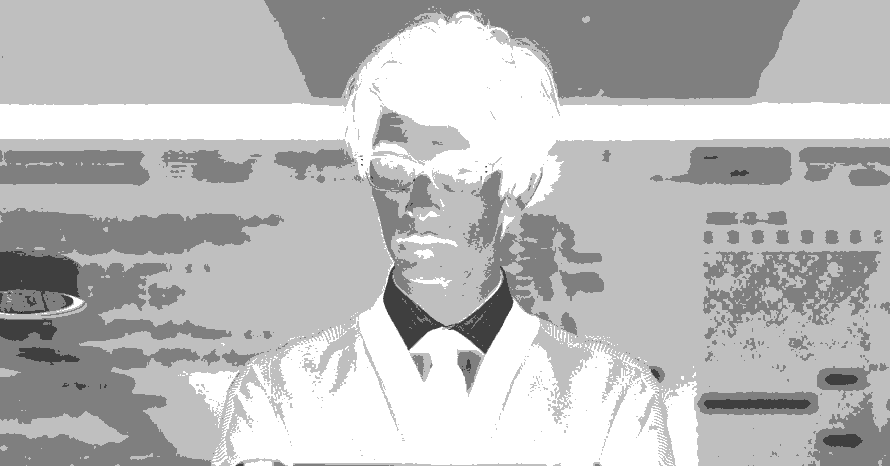

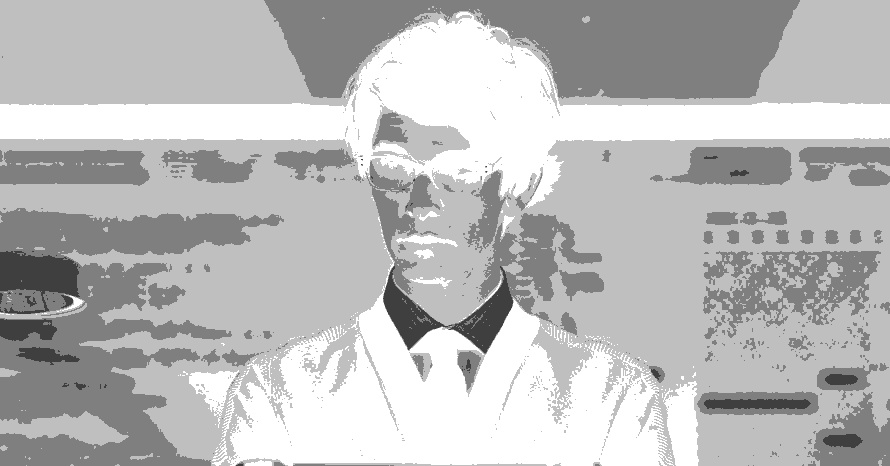

In [75]:
original = cv2.imread(os.path.join(IMAGES, "q.jpg"))
corrupted = cv2.imread(os.path.join(IMAGES, "q_corrupt.jpg"))
cv2_imshow(show_original(original))
cv2_imshow(corrupted)

## **Question 5**

### 5.1

In [76]:
def linContrastStretching(image, a, b):
    result = ((image.astype(np.float32) - np.amin(image)) * (b - a) * 1.0 / (np.amax(image) - np.amin(image))) + a
    result = np.round(result, decimals=0)
    return result.astype(np.uint8)

### 5.2

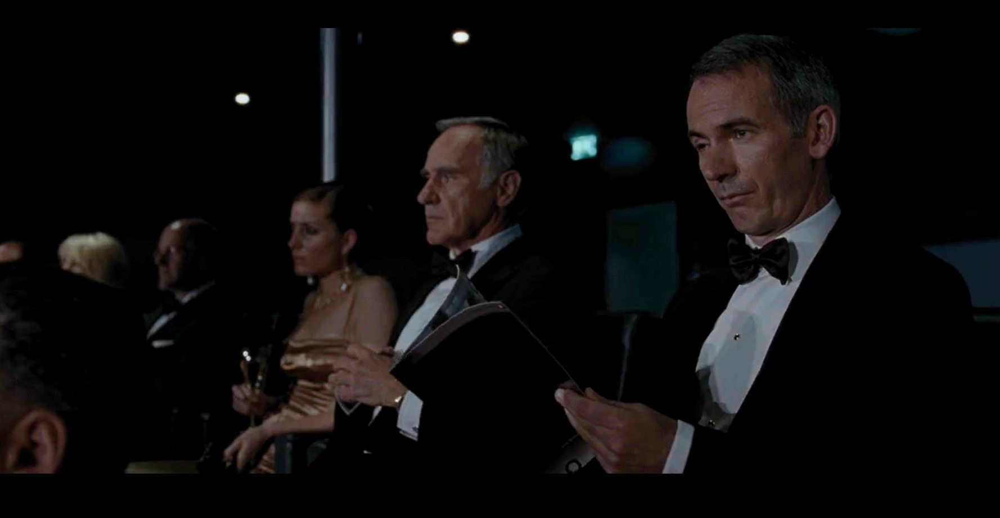

In [77]:
image = cv2.imread(os.path.join(IMAGES, "quantum_bad.jpg"))
cv2_imshow(linContrastStretching(image, 0, 255))

The contrast, for an image, is a measure of the "spread" of its histogram.

Linear Contrast Stretching improves the contrast by stretching the range of intensity values it contains to span a desired range of values.

## **Question 6**

### 6.1

In [78]:
def histEqualization(image):
  rows, cols = image.shape
  hist = np.zeros(256)
  for i in range(256):
    hist[i] = (image <= i).sum() * 1.0 / (rows * cols * 1.0)
  ans = np.round(255.0 * hist[image])
  return ans.astype(np.uint8)

### 6.2

In [79]:
def histMatching(image, reference):
  rows, cols = reference.shape
  matching = histEqualization(image)
  hist = np.zeros(256)
  for i in range(256):
    hist[i] = ((reference <= i).sum() * 1.0) / (rows * cols)
  ans = np.searchsorted(hist, matching / 255)
  return ans.astype(np.uint8)


### 6.3
#### Mathematical formulae for functions **histEqualization** and **histMatching**.
##### Formula for creating histogram: 
$P_x(j) = \sum_{i=0}^{j} P_x(i)$ 
<br>
##### Formula to calculate cumulative sum:
$s_k = \sum_{j=0}^{k} \dfrac{n_j}{N}$

### 6.4.1

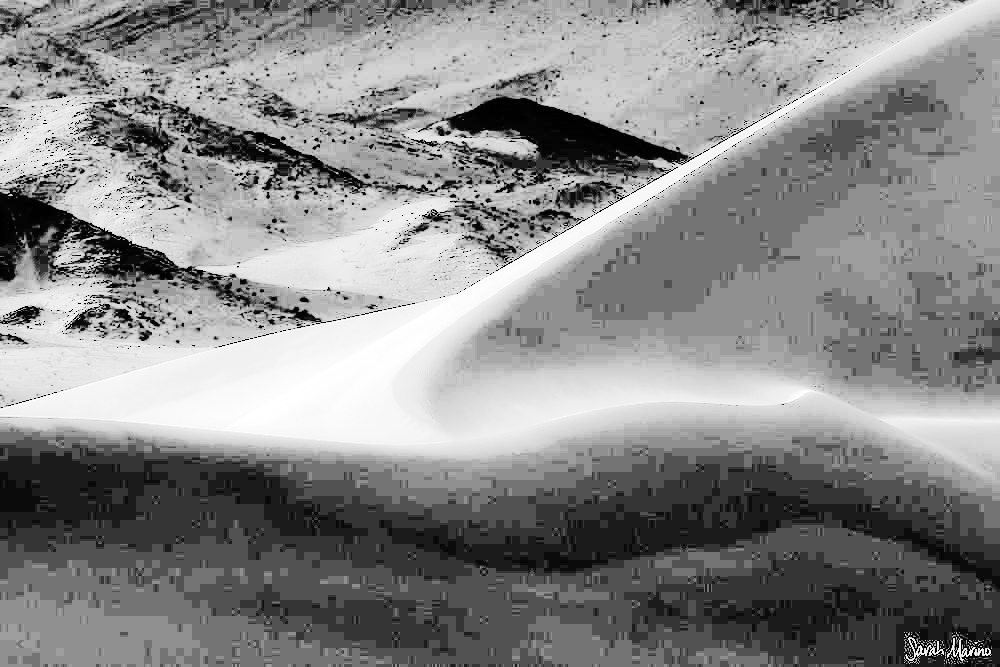

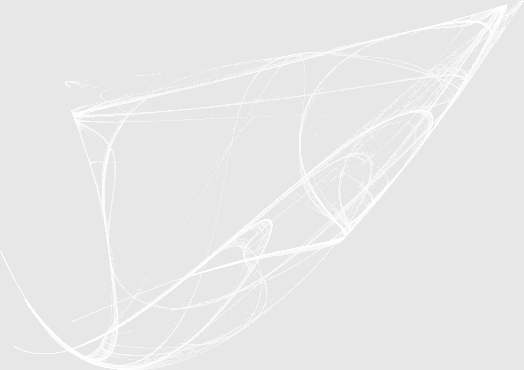

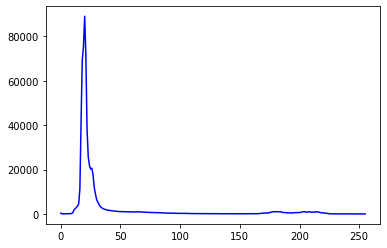

In [80]:
practice = cv2.cvtColor(cv2.imread(os.path.join(IMAGES, "practice_range1.jpg")), cv2.COLOR_BGR2GRAY)
hist = cv2.cvtColor(cv2.imread(os.path.join(IMAGES, "hist.png")), cv2.COLOR_BGR2GRAY)
equalized_practice_range = histEqualization(practice)
equalized_hist = histEqualization(hist)
cv2_imshow(equalized_practice_range)
cv2_imshow(equalized_hist)

a = cv2.calcHist([practice], [0], None, [256], [0,256])
plt.plot(a, color = 'b')

### 6.4.2

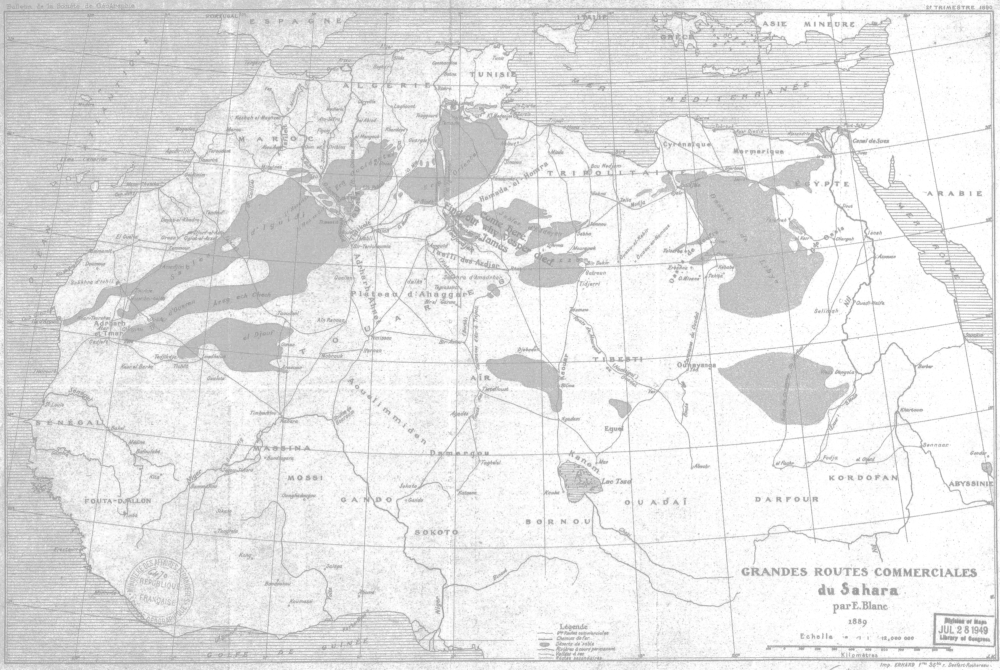

In [81]:
map = cv2.cvtColor(cv2.imread(os.path.join(IMAGES, "Map.jpg")), cv2.COLOR_BGR2GRAY)
satellite = cv2.cvtColor(cv2.imread(os.path.join(IMAGES, "satellite_img.jpg")), cv2.COLOR_BGR2GRAY)
result = histMatching(map, satellite)
cv2_imshow(result)

## **Question 7**

### 7.1

In [82]:
def pixelwiseLinTransform(pix, k1, k2, a, b):
  if (pix < a or pix > b):
    return pix
  return k1 * pix + k2

## 7.2

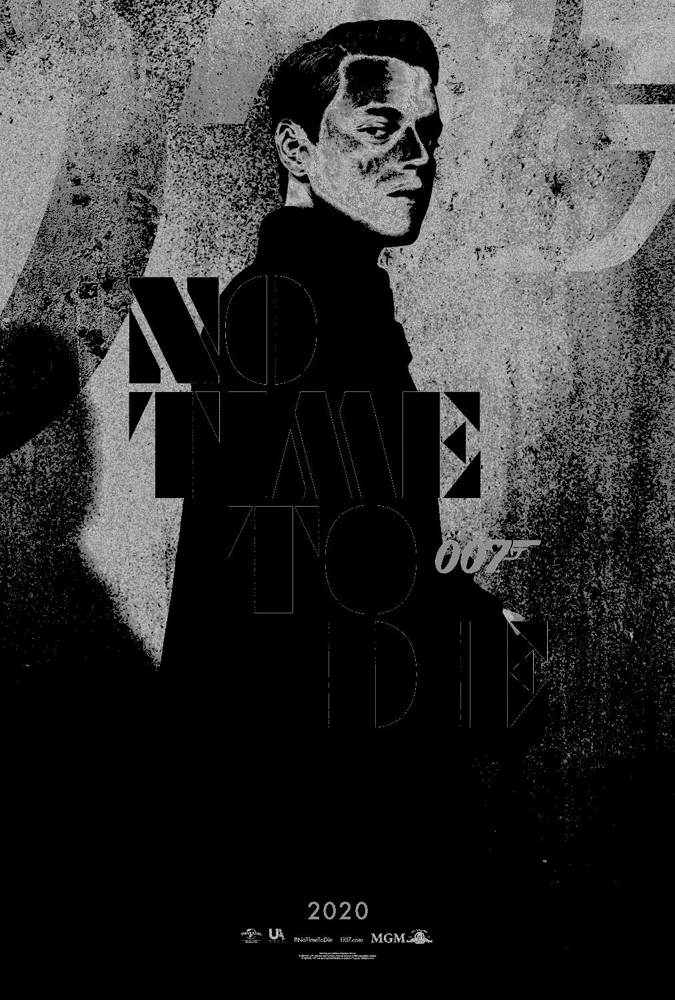

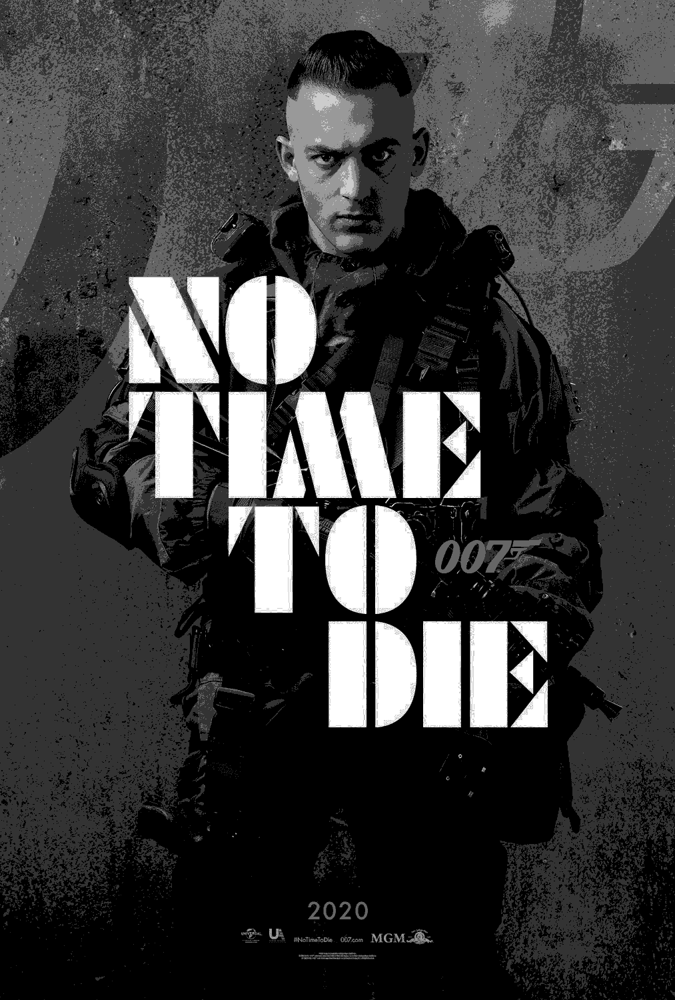

In [83]:
piecewiseLinTransform = np.vectorize(pixelwiseLinTransform) 

bond_villain_1 = cv2.imread(os.path.join(IMAGES, "bondvillain1.jpg") , cv2.IMREAD_GRAYSCALE)
bond_villain_1 = bond_villain_1 / 255
bond_villain_1_1 = piecewiseLinTransform(bond_villain_1,0,0,0,0.3)
bond_villain_1_1 = piecewiseLinTransform(bond_villain_1_1,4/3,0,0.3,0.6)
bond_villain_1_1 = piecewiseLinTransform(bond_villain_1_1,-2,2,0.6,0.8)
bond_villain_1_1 = piecewiseLinTransform(bond_villain_1_1,0,0,0.8,1)
bond_villain_1_1 = bond_villain_1_1 * 255
cv2_imshow(bond_villain_1_1)

bond_villain_2 = cv2.imread(os.path.join(IMAGES, "bondvillain2.jpg") , cv2.IMREAD_GRAYSCALE)
bond_villain_2 = bond_villain_2 / 255
bond_villain_2_1 = piecewiseLinTransform(bond_villain_2,0,0,0,0.2)
bond_villain_2_1 = piecewiseLinTransform(bond_villain_2_1,0,0.2,0.2,0.4)
bond_villain_2_1 = piecewiseLinTransform(bond_villain_2_1,0,0.4,0.4,0.6)
bond_villain_2_1 = piecewiseLinTransform(bond_villain_2_1,0,0.6,0.6,0.8)
bond_villain_2_1 = piecewiseLinTransform(bond_villain_2_1,0,0.8,0.8,0.997)
bond_villain_2_1 = bond_villain_2_1 * 255
cv2_imshow(bond_villain_2_1)


### 7.3

(-0.5, 611.5, 408.5, -0.5)

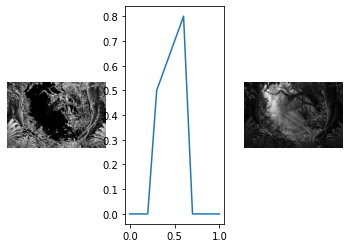

In [84]:
my_image = cv2.imread(os.path.join(IMAGES, "my_image.jpg") , cv2.IMREAD_GRAYSCALE)
my_image = my_image / 255
image = piecewiseLinTransform(my_image, 0, 0, 0.2, 0.5)
image = piecewiseLinTransform(image, 1, 0.2, 0.3, 0.6)
image = piecewiseLinTransform(image, 0, 0, 0.6, 1)

x = np.arange(0, 1.1, 0.1)
y = np.zeros(11)
for i in range(4):
  y[i + 3] = x[i + 3] + 0.2

axes = plt.subplots(1, 3)[1]

axes[0].imshow(image, cmap='gray')
axes[0].axis('off')
axes[1].plot(x, y)
axes[2].imshow(my_image, cmap='gray')
axes[2].axis('off')

## **Question 8**

### 8.1

In [85]:
def gammaTransform(image, gamma):
  return np.array(255 * pow((image / 255), gamma), dtype = 'uint8')

## 8.2

0.4


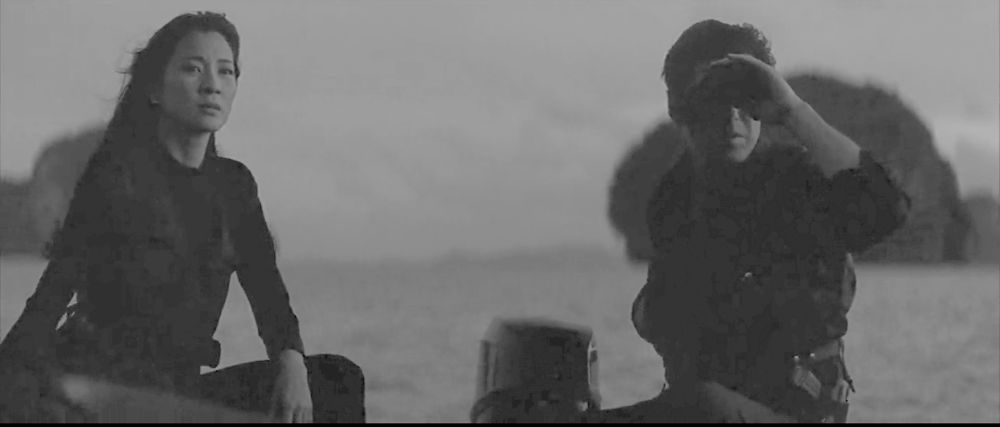

In [86]:
image = cv2.imread(os.path.join(IMAGES, "stealth.png"))
gamma = 0.4
illuminated_image = gammaTransform(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), gamma)
print(gamma)
cv2_imshow(illuminated_image)

### 8.3

4


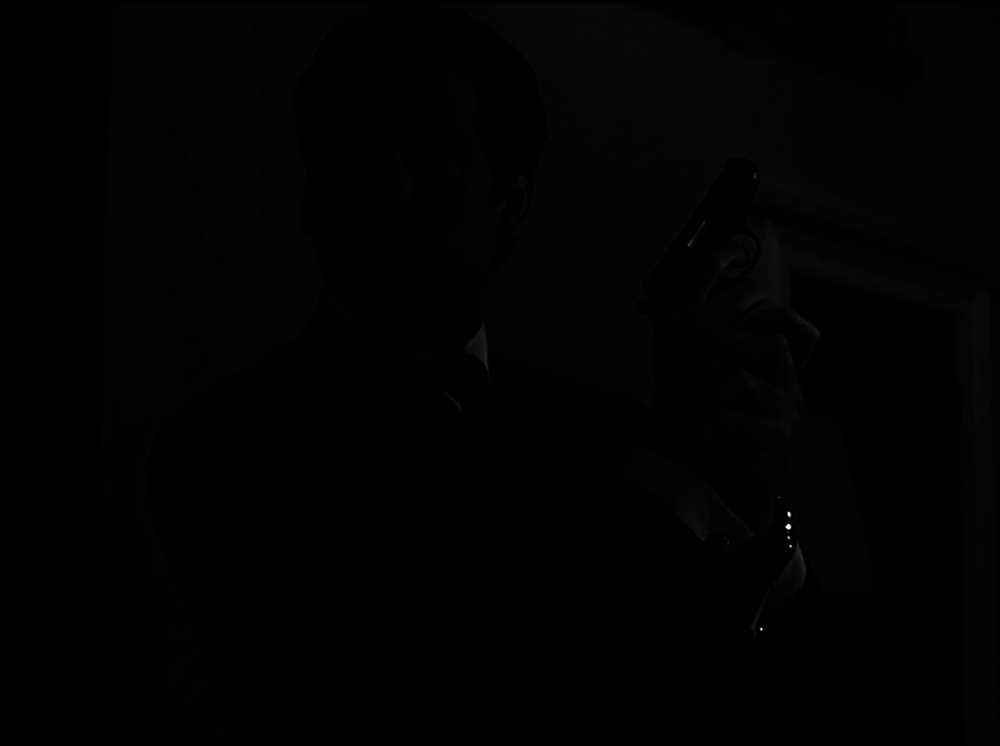

In [87]:
image = cv2.imread(os.path.join(IMAGES, "unstealth.png"))
gamma = 4
darkened_image = gammaTransform(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), gamma)
print(gamma)
cv2_imshow(darkened_image)

## 8.4

0.35


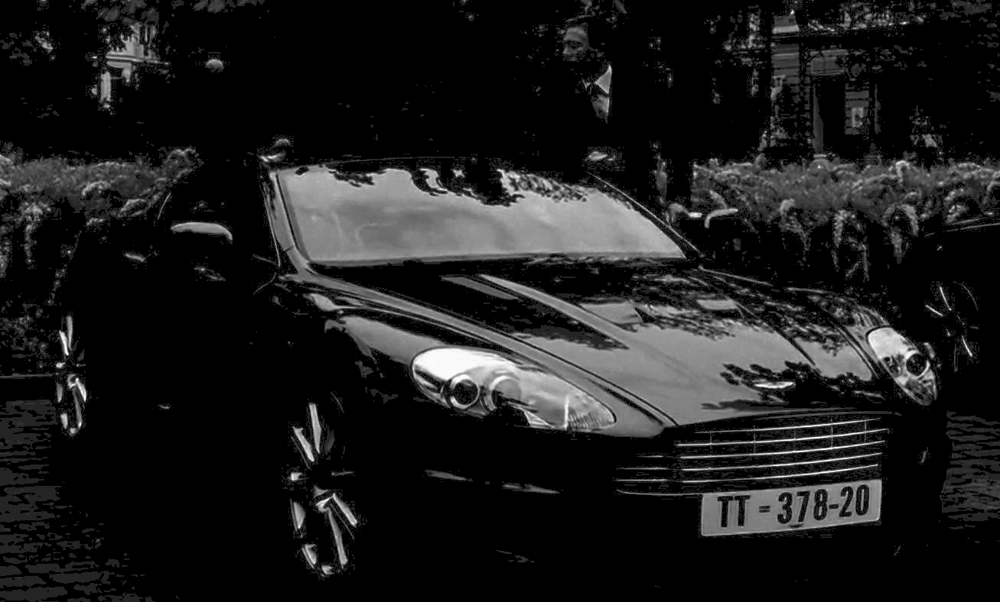

In [88]:
image = cv2.imread(os.path.join(IMAGES, "aston_invisible.jpg"))
gamma = 0.35
illuminated_image = gammaTransform(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), gamma)
print(gamma)
cv2_imshow(illuminated_image)